# 根据Ogle Lake的2D编辑器配置，生成3d的地形、结构体体素信息

In [1]:
import numpy as np
import math
from typing import List, Optional
import xarray as xr
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from enum import Enum

In [2]:
# 导入map_OL2.0_v1_1sizeTimes9x64.json
import json
with open('map_OL2.0_v1_159x64.json', 'r') as f:
    map = json.load(f)

print(map['mapDatas'][0])

FileNotFoundError: [Errno 2] No such file or directory: 'map_OL2.0_v1_159x64.json'

In [3]:
mapDatas = map['mapDatas']

# 探寻最大水深
maxDepth = 0
maxX = 0
maxY = 0

for rows in mapDatas:
    for item in rows:
        maxDepth = max(maxDepth, item['waterDepth'])
        maxX = max(maxX, item['x'])
        maxY = max(maxY, item['y'])

print(maxDepth, maxX, maxY)

maxZ = maxDepth

TypeError: type 'map' is not subscriptable

In [4]:
# 生成湖水的体素，带深度信息
import xarray as xr
import numpy as np
from enum import Enum

class Material(Enum):
    WATER = 0
    WATER_GRASS = 1 # 水草
    STONE = 2 # 石头
    DRIFTWOOD = 3 # 沉木
    PIER = 4 # 桥墩
    GROUND = 5

class FishType(Enum):
    BUFFALO_FISH = 0
    YELLOW_PERCH = 1
    REDEAR_SUNFISH = 2

# 定义湖的尺寸
lake_length = maxX + 1  # x方向的长度
lake_width = maxY + 1  # y方向的宽度
lake_depth = maxZ    # z方向的深度

# 创建一个xarray DataArray来存储体素信息
lake = xr.Dataset(
    {
        'temperature': (('x', 'y', 'z'), np.random.uniform(15, 25, (lake_length, lake_width, lake_depth))),
        'oxygen': (('x', 'y', 'z'), np.random.uniform(5, 10, (lake_length, lake_width, lake_depth))),
        'fish_weights': (('x', 'y', 'z', 'fish_type'), np.random.rand(lake_length, lake_width, lake_depth, len(FishType))),
        'material': (('x', 'y', 'z'), np.full((lake_length, lake_width, lake_depth), Material.GROUND.value, dtype=int)),
    },
    coords={
        'x': range(lake_length),
        'y': range(lake_width),
        'z': range(lake_depth),
        'fish_type': [ft.value for ft in FishType]
    }
)

# 示例：访问某个体素的信息
print(lake.isel(x=0, y=0, z=0))

# 映射表头到枚举值
material_mapping = {
    'Water': Material.WATER,
    'Water Grass': Material.WATER_GRASS,
    'Stone': Material.STONE,
    'Driftwood': Material.DRIFTWOOD,
    'Pier': Material.PIER,
    'Ground': Material.GROUND
}

fish_mapping = {
    '水牛鱼': FishType.BUFFALO_FISH,
    '小冠太阳鱼': FishType.REDEAR_SUNFISH,
    '黄金鲈': FishType.YELLOW_PERCH
}

# 反向映射枚举值到表头
reverse_material_mapping = {v: k for k, v in material_mapping.items()}
reverse_fish_mapping = {v: k for k, v in fish_mapping.items()}

<xarray.Dataset> Size: 68B
Dimensions:       (fish_type: 3)
Coordinates:
    x             int32 4B 0
    y             int32 4B 0
    z             int32 4B 0
  * fish_type     (fish_type) int32 12B 0 1 2
Data variables:
    temperature   float64 8B 20.82
    oxygen        float64 8B 6.347
    fish_weights  (fish_type) float64 24B 0.9287 0.8156 0.7364
    material      int32 4B 5


### 处理地图各个体素的material信息，水面物体应该一直通到底下

In [5]:
# 查看mapDatas里的数据，将x、y坐标对应的waterDepth数提取出来，然后把lake当中对应x、y坐标的一系列体素，z<waterDepth的material设置为WATER
for rows in mapDatas:
    for item in rows:
        x = item['x']
        y = item['y']
        waterDepth = item['waterDepth']
        for z in range(waterDepth):
            lake.material[x, y, z] = Material.WATER.value
        
        # bottom barriers, 水下物体一直认为是1米高
        if item['underWaterType'] == Material.WATER_GRASS.value:
            lake.material[x, y, waterDepth-1] = Material.WATER_GRASS.value
        if item['underWaterType'] == Material.STONE.value:
            lake.material[x, y, waterDepth-1] = Material.STONE.value
        if item['underWaterType'] == Material.DRIFTWOOD.value:
            lake.material[x, y, waterDepth-1] = Material.DRIFTWOOD.value

        # check if there is surface type greater than 2, if so, print it
        if item['surfaceType'] > 2:
            print(f'surfaceType of ({x},{y}) greater than 2:', item['surfaceType'])
        if item['underWaterType'] > 2:
            print(f'underWaterType of ({x},{y}) greater than 2:', item['underWaterType'])

        # 水面上有物体，则一直通到水底下
        if item['surfaceType'] == Material.WATER_GRASS.value:
            for z in range(waterDepth):
                lake.material[x, y, z] = Material.WATER_GRASS.value
        if item['surfaceType'] == Material.STONE.value:
            for z in range(waterDepth):
                lake.material[x, y, z] = Material.STONE.value


In [4]:
# 检查：有没有x，y点上z=0的体素是WATER，而z=1的体素是GROUND？
hasDepth1Point = False
for x in range(lake_length):
    for y in range(lake_width):
        if lake.material[x, y, 0] == Material.WATER.value and lake.material[x, y, 1] == Material.GROUND.value:
            hasDepth1Point = True
            # print(f'({x},{y}) has z=0 is WATER and z=1 is GROUND')
            break
print('hasDepth1Point:', hasDepth1Point)

NameError: name 'lake_length' is not defined

# draw part
上面的跑完之后，确认了是没有沉木、桥墩的，我们把其中一部分画出来看看

In [5]:
# 定义几个用来小范围绘制的参数  update：现在已经不用了
x_start= 0
x_end = maxX+1
y_start = 0
y_end = maxY+1

NameError: name 'maxX' is not defined

In [8]:
import plotly.graph_objects as go

size = 10

# 定义颜色和透明度. water: blue, ground: black, water grass: green, stone: grey; all half-transparent
colors = {
    Material.WATER.value: (0, 0, 1, 0.5),  # 半透明蓝色
    Material.GROUND.value: (0, 0, 0, 0)  # 透明
    ,Material.WATER_GRASS.value: (0, 1, 0, 1)  # 绿色
    , Material.STONE.value: (0.8, 0.8, 0.8, 1)  # 灰白色
}

# 创建一个空的 Figure
fig = go.Figure()

# 遍历每个体素并添加点到 Figure 中
x_points = []
y_points = []
z_points = []
color_points = []

for x in range(lake_length):
    for y in range(lake_width):
        for z in range(lake_depth):
            material = lake['material'].isel(x=x, y=y, z=z).item()
            color = colors[material]
            x_points.append(x + 0.5)
            y_points.append(y + 0.5)
            z_points.append(z + 0.5)
            color_points.append(color)

# 添加点到图形中
fig.add_trace(go.Scatter3d(
    x=x_points,
    y=y_points,
    z=z_points,
    mode='markers',
    marker=dict(
        size=5,
        color=color_points,
        opacity=0.8
    )
))


# 设置布局
fig.update_layout(
    scene=dict(
        xaxis=dict(nticks=10, range=[x_start, x_end]),
        yaxis=dict(nticks=10, range=[y_start, y_end]),
        zaxis=dict(nticks=5, range=[lake_depth, 0]),
            aspectratio=dict(x=size * lake_length/lake_length, y=size * lake_width/lake_length, z=size * lake_depth/lake_length)
    ),
    width=800,
    height=800,
    margin=dict(r=20, l=10, b=10, t=10),

)

# 显示图形
fig.show()

# 水温分层

In [6]:
import numpy as np
import pandas as pd

# 1. 定义常量
MAX_STRUCT_TYPE_ID = 30 
MAX_LAYER_TYPES = 5 

def build_dense_matrices(df):
    num_fishes = len(df)
    
    # ----------------------------------------------------
    # Quality ID Indexing (User Request)
    # ----------------------------------------------------
    if 'qualityId' not in df.columns:
         print("Error: 'qualityId' not found in DataFrame columns!")
         raise KeyError("qualityId missing")
         
    # We will use this index for all constructed DataFrames
    fish_quality_ids = df['qualityId'].values
    
    # ----------------------------------------------------
    # 1. Temp Affinity DataFrame (Fish x ScalarVars)
    # ----------------------------------------------------
    print("Building Temp Affinity DataFrame...")
    # Extract columns directly
    temp_cols = ['temperatureFav', 'tempAffectedRatio', 'tempThreshold']
    # Create copy to avoid SettingWithCopy and for renaming
    temp_df = df[temp_cols].copy()
    
    # *** SET INDEX ***
    temp_df.index = fish_quality_ids
    
    # Normalize/Scale Values
    # 220 -> 22.0, 10000 -> 1.0
    temp_df['temperatureFav'] = temp_df['temperatureFav'] / 10.0
    temp_df['tempAffectedRatio'] = temp_df['tempAffectedRatio'] / 10000.0
    temp_df['tempThreshold'] = temp_df['tempThreshold'] / 10000.0
    
    # Handle Missing
    if temp_df.isnull().values.any():
        print("Warning: NaN found in Temp params. Filling with defaults for demo.")
        temp_df.fillna(0, inplace=True)

    print("Temp DF Head (Indexed by QualityId):")
    print(temp_df.head())

    # ----------------------------------------------------
    # 2. Struct Affinity DataFrame (Fish x StructType)
    # ----------------------------------------------------
    print("\nBuilding Struct Affinity DataFrame...")
    struct_rows = []
    
    for idx, row in df.iterrows():
        s_list = row.get('structList')
        row_dict = {}
        if isinstance(s_list, list):
            for item in s_list:
                s_type = item.get('structType')
                coeff = item.get('coeff')
                if s_type is not None and s_type < MAX_STRUCT_TYPE_ID:
                    row_dict[s_type] = coeff
        struct_rows.append(row_dict)
    
    # Create DF, sparse fill, *** SET INDEX ***
    struct_df = pd.DataFrame(struct_rows, index=fish_quality_ids)
    
    # Reindex to ensure we have all columns 0..MAX_ID-1
    struct_df = struct_df.reindex(columns=range(MAX_STRUCT_TYPE_ID), fill_value=0) 
    struct_df.fillna(0, inplace=True)
    
    print("Struct DF Head (Cols 0-5, Indexed by QualityId):")
    print(struct_df.iloc[:, :6].head())

    # ----------------------------------------------------
    # 3. Layer Affinity DataFrame (Fish x LayerType)
    # ----------------------------------------------------
    print("\nBuilding Layer Affinity DataFrame...")
    layer_rows = []
    for idx, row in df.iterrows():
        l_list = row.get('layerList')
        row_dict = {}
        if isinstance(l_list, list):
            for item in l_list:
                l_type = item.get('layerType')
                coeff = item.get('coeff')
                if l_type is not None and l_type < MAX_LAYER_TYPES:
                    row_dict[l_type] = coeff
        layer_rows.append(row_dict)
        
    # *** SET INDEX ***
    layer_df = pd.DataFrame(layer_rows, index=fish_quality_ids)
    
    layer_df = layer_df.reindex(columns=range(MAX_LAYER_TYPES), fill_value=1.0) # Default 1.0
    layer_df.fillna(1.0, inplace=True)
    
    print("Layer DF Head (Indexed by QualityId):")
    print(layer_df.head())

    # ----------------------------------------------------
    # 4. Convert to Numpy (float16)
    # ----------------------------------------------------
    m_struct = struct_df.values.astype(np.float16)
    m_layer = layer_df.values.astype(np.float16)
    m_temp = temp_df.values.astype(np.float16)
    
    return m_struct, m_layer, m_temp, temp_df, struct_df # Returning DFs for debug/inspection if needed

print("Converting to Dense Matrices (via DataFrames)...")
stockFishesPd.reset_index(drop=True, inplace=True)
m_struct, m_layer, m_temp, _, _ = build_dense_matrices(stockFishesPd)

print(f"\nFinal Struct Matrix: {m_struct.shape}")
print(f"Final Layer Matrix:  {m_layer.shape}")
print(f"Final Temp Params:   {m_temp.shape}")

Converting to Dense Matrices (via DataFrames)...


NameError: name 'stockFishesPd' is not defined

In [10]:
# 设置温度
# set temperature of all lake voxels to temperature0Surface - temperature_slope * lake.coords['z'].data
temperature_data = temperatureSurface - temperature_slope * lake.coords['z']
print(temperature_data)
lake['temperature'] = (('x', 'y', 'z'), np.tile(temperature_data, (lake_length, lake_width, 1)))

<xarray.DataArray 'z' (z: 5)> Size: 40B
array([25.  , 21.25, 17.5 , 13.75, 10.  ])
Coordinates:
  * z        (z) int32 20B 0 1 2 3 4


In [11]:
# plot temperature with plotly 
fig = go.Figure()

temperature = lake['temperature'].values
material = lake['material'].values

# 创建网格
x_range = np.arange(0, lake_length)
y_range = np.arange(0, lake_width)
z_range = np.arange(lake_depth)

x_grid, y_grid, z_grid = np.meshgrid(x_range, y_range, z_range, indexing='ij')

# 过滤掉 Material.GROUND 的点
mask = material != Material.GROUND.value

x_points = x_grid[mask] + 0.5
y_points = y_grid[mask] + 0.5
z_points = z_grid[mask] + 0.5
color_points = temperature[mask]

# 添加点到图形中
fig.add_trace(go.Scatter3d(
    x=x_points,
    y=y_points,
    z=z_points,
    mode='markers',
    marker=dict(
        size=5,
        color=color_points,
        colorscale='Viridis',
        cmin=0,
        cmax=35,
        opacity=0.8
    )
))

# 设置布局
fig.update_layout(
    scene=dict(
        xaxis=dict(nticks=10, range=[0, lake_length]),
        yaxis=dict(nticks=10, range=[0, lake_width]),
        zaxis=dict(nticks=5, range=[lake_depth, 0]),
        aspectmode='manual',
        aspectratio=dict(x=lake_length/20, y=lake_width/20, z=lake_depth/10)
    ),
    width=800,
    height=800,
    margin=dict(r=20, l=10, b=10, t=10)
)

# 显示图形
fig.show()

# 地形（开放水域、结构体）亲和度

In [12]:
# 映射表头到枚举值
material_mapping = {
    'Water': Material.WATER,
    'Water Grass': Material.WATER_GRASS,
    'Stone': Material.STONE,
    'Driftwood': Material.DRIFTWOOD,
    'Pier': Material.PIER,
    'Ground': Material.GROUND
}

fish_mapping = {
    '水牛鱼': FishType.BUFFALO_FISH,
    '小冠太阳鱼': FishType.REDEAR_SUNFISH,
    '黄金鲈': FishType.YELLOW_PERCH,
    }

FAV_TEMPERATURE = "喜好水温"
COEF_TEMPERATURE = "水温-权重衰减系数"
FAV_OXYGEN = "喜好含氧量"
COEF_OXYGEN = "含氧量-权重衰减系数"
VISUAL_LOW = "视觉低光阈值"
COEF_SMELL = "嗅觉衰减系数"
SMELL_MAX = "嗅觉最大距离"
PROB_SCORE_BASELINE = "基准权重"

# 反向映射枚举值到表头
reverse_material_mapping = {v: k for k, v in material_mapping.items()}
reverse_fish_mapping = {v: k for k, v in fish_mapping.items()}

In [13]:
# 用pandas读取 exampleTables/exampleData.xlsx，把里面各个sheet的数据读取到pandas DataFrame中
import pandas as pd

material_df = pd.read_excel('exampleTables/exampleData.xlsx', sheet_name='material', index_col=0)
environment_df = pd.read_excel('exampleTables/exampleData.xlsx', sheet_name='environment', index_col=0)
pond_df = pd.read_excel('exampleTables/exampleData.xlsx', sheet_name='pond', index_col=0)
bait_df = pd.read_excel('exampleTables/exampleData.xlsx', sheet_name='bait')
# print(bait_df)

In [14]:
# 检索亲和系数的函数
def get_affinity(fish_type, material):
    try:
        fish_name = reverse_fish_mapping[fish_type]
        material_name = reverse_material_mapping[material]
        return material_df.loc[fish_name, material_name]
    except KeyError:
        return None

def get_fish_attr(fish_type: FishType, attr: str):
    try:
        fish_name = reverse_fish_mapping[fish_type]
        return environment_df.loc[fish_name, attr]
    except KeyError:
        return None
    
def get_pond_attr(fish_type: FishType, attr: str):
    try:
        fish_name = reverse_fish_mapping[fish_type]
        return pond_df.loc[fish_name, attr]
    except KeyError:
        return None
    
# 获取鱼饵的吸引力,返回的是一个numpy array，顺序按照FishType的顺序
def get_bait_appeals(bait_name: str):
    # bait_name对应的是bait_df的列名，我们将这一列全部拿出来
    column = bait_df[bait_name]
    return column.values

# # 示例用法
# fish_type = FishType.BUFFALO_FISH
# material = Material.WATER_GRASS
# affinity = get_affinity(fish_type, material)

# print(f"The affinity between {fish_type.name} and {material.name} is {affinity}")
# print(f'fish_type: {fish_type} 喜好水温: {environment_df.loc[reverse_fish_mapping[fish_type], FAV_TEMPERATURE]}')
# print(f'fish_type: {fish_type} 水温-权重衰减系数: {get_fish_attr(fish_type, COEF_TEMPERATURE)}')
# print(f'fish_type: {fish_type} 基准权重： {get_pond_attr(fish_type, PROB_SCORE_BASELINE)}')

# 加上温度，综合鱼的活跃系数/温度亲和系数，综合鱼种的基准权重

In [15]:
calcFishType = FishType.REDEAR_SUNFISH
calcProbScoreBase = get_pond_attr(calcFishType, PROB_SCORE_BASELINE)
calcFavTemperature = get_fish_attr(calcFishType, FAV_TEMPERATURE)
calcCoefTemperature = get_fish_attr(calcFishType, COEF_TEMPERATURE)

# 将 DataFrame 的一行转换为字典
redear_material_affinity_map = material_df.loc[reverse_fish_mapping[calcFishType]].to_dict()
redear_material_affinity_map = {material_mapping[k].value: v for k, v in redear_material_affinity_map.items()}
redear_mat_aff_np = np.vectorize(redear_material_affinity_map.get)

# 用lake['material']的地形和redearSunfish的material亲和度，计算出redearSunfish在每个体素的亲和度
# 以lake['material']每个体素的material为索引，结合redearSunfish的material亲和度，生成一个新的DataArray
print(redear_material_affinity_map)

lake_redear_affinity = redear_mat_aff_np(lake['material'].values)
# print(lake_redear_affinity)

{0: 0.3, 1: 1.0, 2: 0.7, 3: 0.9, 4: 0.6, 5: 0.0}


In [16]:
# plot lake_redear_affinity with plotly
fig = go.Figure()

material = lake['material'].values

# 创建网格
x_range = np.arange(0, lake_length)
y_range = np.arange(0, lake_width)
z_range = np.arange(lake_depth)

x_grid, y_grid, z_grid = np.meshgrid(x_range, y_range, z_range, indexing='ij')

# 过滤掉 Material.GROUND 的点
mask = material != Material.GROUND.value

x_points = x_grid[mask] + 0.5
y_points = y_grid[mask] + 0.5
z_points = z_grid[mask] + 0.5
color_points = lake_redear_affinity[mask]

# 添加点到图形中
fig.add_trace(go.Scatter3d(
    x=x_points,
    y=y_points,
    z=z_points,
    mode='markers',
    marker=dict(
        size=5,
        color=color_points,
        colorscale='Viridis',
        cmin=0,
        cmax=1,
        opacity=0.8
    )
))

# 设置布局
fig.update_layout(
    scene=dict(
        xaxis=dict(nticks=10, range=[0, lake_length]),
        yaxis=dict(nticks=10, range=[0, lake_width]),
        zaxis=dict(nticks=5, range=[lake_depth, 0]),
        aspectmode='manual',
        aspectratio=dict(x=lake_length/20, y=lake_width/20, z=lake_depth/10)
    ),
    width=800,
    height=800,
    margin=dict(r=20, l=10, b=10, t=10)
)

# 显示图形
fig.show()

In [17]:
mu = environment_df.loc[reverse_fish_mapping[calcFishType], FAV_TEMPERATURE]
sigma = environment_df.loc[reverse_fish_mapping[calcFishType], COEF_TEMPERATURE]

lakeRedearTempAff = np.exp(-np.power(lake['temperature'] - mu, 2.) / (2 * np.power(sigma, 2.)))
print(lakeRedearTempAff.shape)
mask = lake['material'].values != Material.GROUND.value
print(mask.shape)
print(lake_redear_affinity.shape)
print(lake_redear_affinity[mask].shape)
print(lakeRedearTempAff.values[mask].shape)

(159, 64, 5)
(159, 64, 5)
(159, 64, 5)
(9241,)
(9241,)


In [18]:
# plot temp aff with plotly
fig = go.Figure()

material = lake['material'].values

# 创建网格
x_range = np.arange(0, lake_length)
y_range = np.arange(0, lake_width)
z_range = np.arange(lake_depth)

x_grid, y_grid, z_grid = np.meshgrid(x_range, y_range, z_range, indexing='ij')

# 过滤掉 Material.GROUND 的点
mask = material != Material.GROUND.value

x_points = x_grid[mask] + 0.5
y_points = y_grid[mask] + 0.5
z_points = z_grid[mask] + 0.5
color_points = lakeRedearTempAff.values[mask]

# 添加点到图形中
fig.add_trace(go.Scatter3d(
    x=x_points,
    y=y_points,
    z=z_points,
    mode='markers',
    marker=dict(
        size=5,
        color=color_points,  # 使用 color_points 来映射颜色
        cmin=0,
        cmax=1,
        colorscale='viridis',  # 使用 Inferno 颜色映射
        opacity=0.5  # 设置全局透明度
    )
))

# 设置布局
fig.update_layout(
    scene=dict(
        xaxis=dict(nticks=10, range=[0, lake_length]),
        yaxis=dict(nticks=10, range=[0, lake_width]),
        zaxis=dict(nticks=5, range=[lake_depth, 0]),
        aspectmode='manual',
        aspectratio=dict(x=lake_length/20, y=lake_width/20, z=lake_depth/10)
    ),
    width=800,
    height=800,
    margin=dict(r=20, l=10, b=10, t=10)
)

# 显示图形
fig.show()

## redear 综合钓场基准权重、温度和地形物质

In [19]:
lake_redear_affinity_da = xr.DataArray(lake_redear_affinity, coords=lake['material'].coords, dims=lake['material'].dims)
lake_redear_temp_da = xr.DataArray(lakeRedearTempAff.values, coords=lake['temperature'].coords, dims=lake['temperature'].dims)
lakeRedearProb = xr.DataArray(pond_df.loc[reverse_fish_mapping[calcFishType], PROB_SCORE_BASELINE], coords=lake['material'].coords, dims=lake['material'].dims)

lakeRedearProb = lakeRedearProb * lake_redear_affinity_da 
lakeRedearProb = lakeRedearProb * lake_redear_temp_da
# 到这里小冠太阳鱼的计算完了

In [20]:
# plot lakeRedearProb with plotly, color scale using greys
fig = go.Figure()

material = lake['material'].values

# 创建网格
x_range = np.arange(0, lake_length)
y_range = np.arange(0, lake_width)
z_range = np.arange(0, lake_depth)

x_grid, y_grid, z_grid = np.meshgrid(x_range, y_range, z_range, indexing='ij')

# 过滤掉 Material.GROUND 的点
mask = material != Material.GROUND.value

x_points = x_grid[mask] + 0.5
y_points = y_grid[mask] + 0.5
z_points = z_grid[mask] + 0.5
# color_points = lake_redear_affinity_da.values[mask]
color_points = lakeRedearProb.values[mask].flatten()/500
# color_points = npRedearProb.flatten()/500
# color_points = lake_redear_affinity_da.values.flatten()
# color_points = lake_redear_affinity.flatten()
# color_points = np.full((lake_length, lake_width, lake_depth), 1)
print(color_points.shape)

# 添加点到图形中
fig.add_trace(go.Scatter3d(
    # x=x_grid.flatten(),
    # y=y_grid.flatten(),
    # z=z_grid.flatten(),
    x=x_points,
    y=y_points,
    z=z_points,
    mode='markers',
    marker=dict(
        size=5,
        color=color_points,  # 使用 color_points 来映射颜色
        cmin=0,
        cmax=1,
        # colorscale='greys',  
        # opacity=1  # 设置全局透明度
        colorscale='viridis',
        opacity=0.5  # 设置全局透明度
    )
))

# 设置布局
fig.update_layout(
    scene=dict(
        xaxis=dict(nticks=10, range=[0, lake_length]),
        yaxis=dict(nticks=10, range=[0, lake_width]),
        zaxis=dict(nticks=5, range=[lake_depth, 0]),
        aspectmode='manual',
        aspectratio=dict(x=lake_length/20, y=lake_width/20, z=lake_depth/10)
    ),
    width=800,
    height=800,
    margin=dict(r=20, l=10, b=10, t=10)
)

# 显示图形
fig.show()

(9241,)


# 开始晕染

In [21]:
# 拿到小冠太阳鱼的几个属性：视觉低光阈值，嗅觉衰减系数，嗅觉最大距离
calcFishType = FishType.REDEAR_SUNFISH
calcVisualLow = get_fish_attr(calcFishType, VISUAL_LOW)
calcCoefSmell = get_fish_attr(calcFishType, COEF_SMELL)
calcSmellMax = get_fish_attr(calcFishType, SMELL_MAX)

# 视觉低光阈值是否大于0？大于0则用视觉来计算晕染，否则用嗅觉来计算晕染
# if calcVisualLow > 0:
    # print('use visual')

# 用视觉来计算晕染

In [22]:
MaxBleedingSteps = 5
# 看一下晕染5步，不同的K值，到了第5步衰减到什么程度
Ks = np.arange(0.5, 1.0, 0.1)
print(np.power(Ks, MaxBleedingSteps))


[0.03125 0.07776 0.16807 0.32768 0.59049]


In [23]:
# 每一米的衰减系数为0.7，也就是，光传播到一米外强度还剩0.7
# 但是鱼看见了也会由于离得远而不愿意过来，所以每一米的钓鱼权重衰减系数为0.5
# 接下来我们一米一米的做衰减，最多做5米
# 从上面的lakeRedearProb，每一个元素向上下左右前后六个方向传播，每传播一步，强度乘以K
# 方法是将lakeRedearProb做x,y,z轴的shift，然后乘K，若大于原来的值则更新原来的值，否则不更新
# 同时记录下每个体素是不是在哪一步被传播到的，下一步的时候，只传播上一步传播到的体素
K = 0.7
lakeWhenBleeded = np.full((lake_length, lake_width, lake_depth), -1)
curStep = -1

In [24]:
# 作一步晕染，和一次绘图更新
curStep = curStep + 1

print('curStep:', curStep)
# 向6个方向传播
lakeRedearProbShifted = [0,1,2,3,4,5]

# 创建 masked_da，条件是对应的material不是GROUND也不是WATER
masked_da = xr.where(lakeWhenBleeded == (curStep - 1), lakeRedearProb, 0)

# 向6个方向传播,做shift，然后乘K，然后和lakeRedearProb比较，若高于则用最高的更新lakeRedearProb
lakeRedearProbShifted = [0, 1, 2, 3, 4, 5]
lakeRedearProbShifted[0] = masked_da.shift(x=1, fill_value=0) * K
lakeRedearProbShifted[1] = masked_da.shift(x=-1, fill_value=0) * K
lakeRedearProbShifted[2] = masked_da.shift(y=1, fill_value=0) * K
lakeRedearProbShifted[3] = masked_da.shift(y=-1, fill_value=0) * K
lakeRedearProbShifted[4] = masked_da.shift(z=1, fill_value=0) * K
lakeRedearProbShifted[5] = masked_da.shift(z=-1, fill_value=0) * K

# 首先检查6个shifted array是否都小鱼lakeRedearProb原来的值,如果是则不更新,也不更新lakeWhenBleeded对应元素
# 如果有一个大于lakeRedearProb原来的值，则更新lakeRedearProb和lakeWhenBleeded
maxProb = np.maximum(lakeRedearProbShifted[0], lakeRedearProb)
maxProb = np.maximum(maxProb, lakeRedearProbShifted[1])
maxProb = np.maximum(maxProb, lakeRedearProbShifted[2])
maxProb = np.maximum(maxProb, lakeRedearProbShifted[3])
maxProb = np.maximum(maxProb, lakeRedearProbShifted[4])
maxProb = np.maximum(maxProb, lakeRedearProbShifted[5])

bleededMask = (maxProb > lakeRedearProb) & (material != Material.GROUND.value)
lakeWhenBleeded = xr.where(bleededMask, curStep, lakeWhenBleeded)
# 用maxProb里面的值更新lakeRedearProb
lakeRedearProb = maxProb

# 用plotly画出lakeRedearProb
plt = go.Figure()

material = lake['material'].values

# 创建网格
x_range = np.arange(0, lake_length)
y_range = np.arange(0, lake_width)
z_range = np.arange(lake_depth)

x_grid, y_grid, z_grid = np.meshgrid(x_range, y_range, z_range, indexing='ij')

# 过滤掉 Material.GROUND 的点
mask = material != Material.GROUND.value

x_points = x_grid[mask] + 0.5
y_points = y_grid[mask] + 0.5
z_points = z_grid[mask] + 0.5
color_points = lakeRedearProb.values[mask].flatten()/500

# 添加点到图形中
plt.add_trace(go.Scatter3d(
    x=x_points,
    y=y_points,
    z=z_points,
    mode='markers',
    marker=dict(
        size=5,
        color=color_points,  # 使用 color_points 来映射颜色
        cmin=0,
        cmax=1,
        colorscale='viridis',
        opacity=0.5  # 设置全局透明度
    )
))

# 设置布局
plt.update_layout(
    scene=dict(
        xaxis=dict(nticks=10, range=[0, lake_length]),
        yaxis=dict(nticks=10, range=[0, lake_width]),
        zaxis=dict(nticks=5, range=[lake_depth, 0]),
        aspectmode='manual',
        aspectratio=dict(x=lake_length/20, y=lake_width/20, z=lake_depth/10)
    ),
    width=800,
    height=800,
    margin=dict(r=20, l=10, b=10, t=10)
)

# 显示图形
plt.show()

curStep: 0


## 叠在一起看不清，那我们把表层水单独渲染出来看一下

In [25]:

# plot only z=0
plt = go.Figure()

material = lake['material'].sel(z=0).values
print(material.shape)
material = material.reshape(material.shape[0], material.shape[1], 1)

# 创建网格
x_range = np.arange(0, lake_length)
y_range = np.arange(0, lake_width)
z_range = np.arange(1)

x_grid, y_grid, z_grid = np.meshgrid(x_range, y_range, z_range, indexing='ij')

# 过滤掉 Material.GROUND 的点
mask = material != Material.GROUND.value

x_points = x_grid[mask] + 0.5 
y_points = y_grid[mask] + 0.5
z_points = z_grid[mask] + 0.5

z0LakeRedearProb = lakeRedearProb.sel(z=0).values
z0LakeRedearProb = z0LakeRedearProb.reshape(z0LakeRedearProb.shape[0], z0LakeRedearProb.shape[1], 1)
color_points = z0LakeRedearProb[mask]/500

# 添加点到图形中
plt.add_trace(go.Scatter3d(
    x=x_points,
    y=y_points,
    z=z_points,
    mode='markers',
    marker=dict(
        size=5,
        color=color_points,  # 使用 color_points 来映射颜色
        cmin=0,
        cmax=1,
        colorscale='greys',
        opacity=1  # 设置全局透明度
    )
))

# 设置布局
plt.update_layout(
    scene=dict(
        xaxis=dict(nticks=10, range=[0, lake_length]),
        yaxis=dict(nticks=10, range=[0, lake_width]),
        zaxis=dict(nticks=5, range=[lake_depth, 0]),
        aspectmode='manual',
        aspectratio=dict(x=lake_length/20, y=lake_width/20, z=lake_depth/10)
    ),
    width=800,
    height=800,
    margin=dict(r=20, l=10, b=10, t=10)
)

# 显示图形
plt.show()

(159, 64)


In [26]:
for step in range(-1, 5):
    # 查看lakeWhenBleeded有多少个元素是step
    print(f'step {step} has {np.sum(lakeWhenBleeded == step)} elements')

step -1 has <xarray.DataArray ()> Size: 4B
array(47707) elements
step 0 has <xarray.DataArray ()> Size: 4B
array(3173) elements
step 1 has <xarray.DataArray ()> Size: 4B
array(0) elements
step 2 has <xarray.DataArray ()> Size: 4B
array(0) elements
step 3 has <xarray.DataArray ()> Size: 4B
array(0) elements
step 4 has <xarray.DataArray ()> Size: 4B
array(0) elements


上面 小冠太阳鱼 的权重计算完毕。可以看出来，要钓小冠太阳鱼已经需要一定的策略了。如果把饵扔在水底的开阔水域，钓上来一条 小冠太阳鱼 就不是太容易
# 下面我们来计算 黄金鲈 和 水牛鱼 的权重分布
### 整理上面的函数，整洁一些

In [27]:
# 整理上面的函数
# 鱼和地形物质的亲和度dataArray
def get_env_aff_arr_by_fish_type(fish_type: FishType, lake: xr.Dataset):
    try:
        fish_name = reverse_fish_mapping[fish_type]
        fish_material_affinity_map = material_df.loc[fish_name].to_dict()
        fish_material_affinity_map = {material_mapping[k].value: v for k, v in fish_material_affinity_map.items()}
        fish_mat_aff_np = np.vectorize(fish_material_affinity_map.get)
        
        lakeMaterial = lake['material'].values
        lakeFishAffinity = fish_mat_aff_np(lakeMaterial)
        lakeFishAffinity = xr.DataArray(lakeFishAffinity, coords=lake['material'].coords, dims=lake['material'].dims)
        return lakeFishAffinity
    except KeyError:
        return None
    
# 鱼和水温的亲和度dataArray
def get_temp_aff_arr_by_fish_type(fish_type: FishType, lake: xr.Dataset):
    try:
        mu = environment_df.loc[reverse_fish_mapping[fish_type], FAV_TEMPERATURE]
        sigma = environment_df.loc[reverse_fish_mapping[fish_type], COEF_TEMPERATURE]
        lakeFishTempAff = np.exp(-np.power(lake['temperature'] - mu, 2.) / (2 * np.power(sigma, 2.)))
        lakeFishTempAff = xr.DataArray(lakeFishTempAff.values, coords=lake['temperature'].coords, dims=lake['temperature'].dims)
        return lakeFishTempAff
    except KeyError:
        return None
    
# 鱼和基准权重的亲和度dataArray（在晕染之前）
def get_prob_arr_by_fish_type(fish_type: FishType, lake: xr.Dataset):
    try:
        fish_prob = pond_df.loc[reverse_fish_mapping[fish_type], PROB_SCORE_BASELINE]
        # fish_prob = xr.DataArray(fish_prob, coords=lake['material'].coords, dims=lake['material'].dims)
        # 打印 lake['material'] 的形状
        print("lake['material'] shape:", lake['material'].shape)

        # 打印 fish_prob 的初始形状
        print("Initial fish_prob shape:", fish_prob.shape)

        # 创建 DataArray 并进行广播
        fish_prob_da = xr.DataArray(fish_prob, coords=lake['material'].coords, dims=lake['material'].dims)

        # 打印 fish_prob_da 的形状
        print("fish_prob_da shape after broadcasting:", fish_prob_da.shape)

        # 手动广播 fish_prob
        fish_prob_broadcasted = np.broadcast_to(fish_prob, lake['material'].shape)

        # 创建 DataArray 使用手动广播的数组
        fish_prob_da_manual = xr.DataArray(fish_prob_broadcasted, coords=lake['material'].coords, dims=lake['material'].dims)

        # 打印手动广播后的形状
        print("fish_prob_da_manual shape after manual broadcasting:", fish_prob_da_manual.shape)
        env_aff_arr = get_env_aff_arr_by_fish_type(fish_type, lake)
        fish_prob = fish_prob * env_aff_arr
        fish_prob = fish_prob * get_temp_aff_arr_by_fish_type(fish_type, lake)
        return fish_prob
    except KeyError:
        return None
    
# 晕染函数
def bleedStep(arrBeforeBleed: xr.DataArray, K: float, lakeWhenBleeded: np.ndarray, curStep: int, lake: xr.Dataset):
    # 创建 masked_da. 只有上一步被传播到的体素，这一步才会向邻居传播
    masked_da = xr.where(lakeWhenBleeded == (curStep - 1), arrBeforeBleed, 0)
    
    # 向6个方向传播
    arrShifted = [0, 1, 2, 3, 4, 5]
    arrShifted[0] = masked_da.shift(x=1, fill_value=0) * K
    arrShifted[1] = masked_da.shift(x=-1, fill_value=0) * K
    arrShifted[2] = masked_da.shift(y=1, fill_value=0) * K
    arrShifted[3] = masked_da.shift(y=-1, fill_value=0) * K
    arrShifted[4] = masked_da.shift(z=1, fill_value=0) * K
    arrShifted[5] = masked_da.shift(z=-1, fill_value=0) * K

    # 首先检查6个shifted array是否都小鱼lakeRedearProb原来的值,如果是则不更新,也不更新lakeWhenBleeded对应元素
    # 如果有一个大于lakeRedearProb原来的值，则更新lakeRedearProb和lakeWhenBleeded
    maxProb = np.maximum(arrShifted[0], arrBeforeBleed)
    maxProb = np.maximum(maxProb, arrShifted[1])
    maxProb = np.maximum(maxProb, arrShifted[2])
    maxProb = np.maximum(maxProb, arrShifted[3])
    maxProb = np.maximum(maxProb, arrShifted[4])
    maxProb = np.maximum(maxProb, arrShifted[5])

    bleededMask = (maxProb > arrBeforeBleed) & (lake['material'] != Material.GROUND.value)
    lakeWhenBleeded = xr.where(bleededMask, curStep, lakeWhenBleeded)
    # 用maxProb里面的值更新lakeRedearProb
    arrAfterBleed = maxProb
    return arrAfterBleed, lakeWhenBleeded

def bleedStepsFromScratch(arrBeforeBleed: xr.DataArray, K: float, MaxBleedingSteps: int, lake: xr.Dataset):
    lakeWhenBleeded = np.full(arrBeforeBleed.shape, -1)
    for step in range(MaxBleedingSteps):
        arrBeforeBleed, lakeWhenBleeded = bleedStep(arrBeforeBleed, K, lakeWhenBleeded, step, lake=lake)
    return arrBeforeBleed, lakeWhenBleeded

# plot整个池塘的某种arr,用viridis颜色映射
def plotViridis(arr: xr.DataArray, lake: xr.Dataset, limit: float):
    plt = go.Figure()

    material = lake['material'].values

    # 创建网格
    x_range = np.arange(material.shape[0])
    y_range = np.arange(material.shape[1])
    z_range = np.arange(material.shape[2])

    x_grid, y_grid, z_grid = np.meshgrid(x_range, y_range, z_range, indexing='ij')

    # 过滤掉 Material.GROUND 的点
    mask = material != Material.GROUND.value

    x_points = x_grid[mask] + 0.5
    y_points = y_grid[mask] + 0.5
    z_points = z_grid[mask] + 0.5
    color_points = arr.values[mask]/limit

    # 添加点到图形中
    plt.add_trace(go.Scatter3d(
        x=x_points,
        y=y_points,
        z=z_points,
        mode='markers',
        marker=dict(
            size=5,
            color=color_points,  # 使用 color_points 来映射颜色
            cmin=0,
            cmax=1,
            colorscale='viridis',
            opacity=0.5  # 设置全局透明度
        )
    ))

    # 设置布局
    plt.update_layout(
        scene=dict(
            xaxis=dict(nticks=10, range=[0, lake_length]),
            yaxis=dict(nticks=10, range=[0, lake_width]),
            zaxis=dict(nticks=5, range=[lake_depth, 0]),
            aspectmode='manual',
            aspectratio=dict(x=lake_length/20, y=lake_width/20, z=lake_depth/10)
        ),
        width=800,
        height=800,
        margin=dict(r=20, l=10, b=10, t=10)
    )

    # 显示图形
    plt.show()

# plot整个池塘的某种arr,用greys颜色映射
def plotGreys(arr: xr.DataArray, lake: xr.Dataset, limit: int):
    plt = go.Figure()

    material = lake['material'].values

    # 创建网格
    x_range = np.arange(material.shape[0])
    y_range = np.arange(material.shape[1])
    z_range = np.arange(material.shape[2])

    x_grid, y_grid, z_grid = np.meshgrid(x_range, y_range, z_range, indexing='ij')

    # 过滤掉 Material.GROUND 的点
    mask = material != Material.GROUND.value

    x_points = x_grid[mask] + 0.5
    y_points = y_grid[mask] + 0.5
    z_points = z_grid[mask] + 0.5
    color_points = arr.values[mask]/limit

    # 添加点到图形中
    plt.add_trace(go.Scatter3d(
        x=x_points,
        y=y_points,
        z=z_points,
        mode='markers',
        marker=dict(
            size=5,
            color=color_points,  # 使用 color_points 来映射颜色
            cmin=0,
            cmax=1,
            colorscale='greys',
            opacity=0.5  # 设置全局透明度
        )
    ))

    # 设置布局
    plt.update_layout(
        scene=dict(
            xaxis=dict(nticks=10, range=[0, material.shape[0]]),
            yaxis=dict(nticks=10, range=[0, material.shape[1]]),
            zaxis=dict(nticks=5, range=[material.shape[2], 0]),
            aspectmode='manual',
            aspectratio=dict(x=lake_length/20, y=lake_width/20, z=lake_depth/10)
        ),
        width=800,
        height=800,
        margin=dict(r=20, l=10, b=10, t=10)
    )

    # 显示图形
    plt.show()



In [28]:
# 开始计算黄金鲈
perch_prob = get_prob_arr_by_fish_type(FishType.YELLOW_PERCH, lake)
print(perch_prob[13:15, 13:15, 0:5])
plotViridis(perch_prob, lake, 400)

lake['material'] shape: (159, 64, 5)
Initial fish_prob shape: ()
fish_prob_da shape after broadcasting: (159, 64, 5)
fish_prob_da_manual shape after manual broadcasting: (159, 64, 5)
<xarray.DataArray (x: 2, y: 2, z: 5)> Size: 160B
array([[[ 71.30559183, 293.76821667, 384.00217651,   0.        ,
           0.        ],
        [ 71.30559183, 293.76821667, 384.00217651,   0.        ,
           0.        ]],

       [[ 57.04447347, 235.01457333, 307.20174121,   0.        ,
           0.        ],
        [ 57.04447347, 235.01457333, 307.20174121,   0.        ,
           0.        ]]])
Coordinates:
  * x        (x) int32 8B 13 14
  * y        (y) int32 8B 13 14
  * z        (z) int32 20B 0 1 2 3 4


In [29]:
perchProbAfterBleed, lakeWhenBleeded = bleedStepsFromScratch(perch_prob, 0.7, 5, lake)
plotViridis(perchProbAfterBleed, lake, 400)

In [30]:
buffalo_prob = get_prob_arr_by_fish_type(FishType.BUFFALO_FISH, lake)
buffaloProbAfterBleed, lakeWhenBleeded = bleedStepsFromScratch(buffalo_prob, 0.7, 5, lake)
plotViridis(buffaloProbAfterBleed, lake, 500)
# plotViridis(buffaloProbAfterBleed, lake, pond_df.loc[reverse_fish_mapping[FishType.BUFFALO_FISH], PROB_SCORE_BASELINE])

lake['material'] shape: (159, 64, 5)
Initial fish_prob shape: ()
fish_prob_da shape after broadcasting: (159, 64, 5)
fish_prob_da_manual shape after manual broadcasting: (159, 64, 5)


In [31]:
# 用简洁版代码计算小冠太阳鱼
redear_prob = get_prob_arr_by_fish_type(FishType.REDEAR_SUNFISH, lake)
redearProbAfterBleed, lakeWhenBleeded = bleedStepsFromScratch(redear_prob, 0.7, 5, lake)

lake['material'] shape: (159, 64, 5)
Initial fish_prob shape: ()
fish_prob_da shape after broadcasting: (159, 64, 5)
fish_prob_da_manual shape after manual broadcasting: (159, 64, 5)


# 与饵交互，计算某个饵得到的权重

In [32]:
NONE_FISH_WEIGHT = 10000

# 将 lakeRedearProb 的值赋给 fish_type 为 REDEAR_SUNFISH 的元素
lake['fish_weights'].loc[{'fish_type': FishType.REDEAR_SUNFISH.value}] = redearProbAfterBleed
lake['fish_weights'].loc[{'fish_type': FishType.YELLOW_PERCH.value}] = perchProbAfterBleed
lake['fish_weights'].loc[{'fish_type': FishType.BUFFALO_FISH.value}] = buffaloProbAfterBleed

In [33]:
weightsAtPoint = lake['fish_weights'].loc[{'x': 14, 'y': 14, 'z': 1}]
print(f'综合基础权重列表在{x},{y},{z}点为：',weightsAtPoint)

蝗虫appeals = get_bait_appeals('蝗虫')
print(f'蝗虫对3种鱼以及无鱼的亲和系数:',蝗虫appeals)
# 用蝗虫的appeals来调整权重
locustedWeightAtPoint = weightsAtPoint * 蝗虫appeals
print(f'用蝗虫筛选、减益后，权重列表为：',locustedWeightAtPoint)
# broadcast baitAppeals to the same shape as lake['fish_weights']
蝗虫appeals = np.broadcast_to(蝗虫appeals, lake['fish_weights'].values.shape)
# print(蝗虫appeals[13,13,1])

综合基础权重列表在158,63,4点为： <xarray.DataArray 'fish_weights' (fish_type: 3)> Size: 24B
array([542.77061131, 235.01457333, 406.65918256])
Coordinates:
    x          int32 4B 14
    y          int32 4B 14
    z          int32 4B 1
  * fish_type  (fish_type) int32 12B 0 1 2
蝗虫对3种鱼以及无鱼的亲和系数: [0.5 0.7 1. ]
用蝗虫筛选、减益后，权重列表为： <xarray.DataArray 'fish_weights' (fish_type: 3)> Size: 24B
array([271.38530565, 164.51020133, 406.65918256])
Coordinates:
    x          int32 4B 14
    y          int32 4B 14
    z          int32 4B 1
  * fish_type  (fish_type) int32 12B 0 1 2


In [34]:
# 用蚯蚓试试
蚯蚓appeals = get_bait_appeals('蚯蚓')
weightsAtPoint = lake['fish_weights'].loc[{'x': 14, 'y': 14, 'z': 1}]
print(f'蚯蚓对3种鱼以及无鱼的亲和系数:',蚯蚓appeals)
earthwormedWeightAtPoint = weightsAtPoint * 蚯蚓appeals
print(f'用蚯蚓筛选、减益后，权重列表为：',earthwormedWeightAtPoint)

蚯蚓对3种鱼以及无鱼的亲和系数: [0.8 1.  1. ]
用蚯蚓筛选、减益后，权重列表为： <xarray.DataArray 'fish_weights' (fish_type: 3)> Size: 24B
array([434.21648905, 235.01457333, 406.65918256])
Coordinates:
    x          int32 4B 14
    y          int32 4B 14
    z          int32 4B 1
  * fish_type  (fish_type) int32 12B 0 1 2


### 将3种鱼用RGB绘制分布图

In [35]:
locustAppealedWeights = lake['fish_weights'] * 蝗虫appeals
# print(locustAppealedWeights)

shownLocustWeights = locustAppealedWeights.loc[{'fish_type': [0, 1, 2]}]
# 检索fish type 为0，1，2的范围内，weight的最大值
# loc locustAppealedWeights by fish_weight 0-2
maxWeight = shownLocustWeights.max()

print('max weight is:', maxWeight.values)

normalizedWeights = shownLocustWeights / maxWeight

# plot normalizedWeights with plotly
plt = go.Figure()

material = lake['material'].values

# 创建网格
x_range = np.arange(0, lake_length)
y_range = np.arange(0, lake_width)
z_range = np.arange(lake_depth)

x_grid, y_grid, z_grid = np.meshgrid(x_range, y_range, z_range, indexing='ij')

# 过滤掉 Material.GROUND 的点
mask = material != Material.GROUND.value

x_points = x_grid[mask] + 0.5
y_points = y_grid[mask] + 0.5
z_points = z_grid[mask] + 0.5

# normalizedWeights 的值是一个159，64，5，3的数组，我需要用它计算出一个159*64*5的colors数组，每个color是把fishType这个维度的3个值变成rgb颜色
# 也就是说，我需要把normalizedWeights的最后一个维度的3个值映射变成一个rgb颜色
colors = normalizedWeights.values.reshape(-1, 3)

# 将 RGB 颜色转换为 Plotly 可用的字符串格式
colors_plotly = ['rgb({}, {}, {})'.format(int(r*255), int(g*255), int(b*255)) for r, g, b in colors]

# 用mask筛选colors_plotly
color_points = np.array(colors_plotly)[mask.flatten()]

# 添加点到图形中
plt.add_trace(go.Scatter3d(
    x=x_points,
    y=y_points,
    z=z_points,
    mode='markers',
    marker=dict(
        size=5,
        color=color_points,  # 使用 color_points 来映射颜色
        opacity=0.5  # 设置全局透明度
    )
))

# 设置布局
plt.update_layout(
    scene=dict(
        xaxis=dict(nticks=10, range=[0, lake_length]),
        yaxis=dict(nticks=10, range=[0, lake_width]),
        zaxis=dict(nticks=5, range=[lake_depth, 0]),
        aspectmode='manual',
        aspectratio=dict(x=lake_length/20, y=lake_width/20, z=lake_depth/10)
    ),
    width=800,
    height=800,
    margin=dict(r=20, l=10, b=10, t=10)
)

# 显示图形
plt.show()


max weight is: 456.1270384142726


### 可以看到，不同的饵能够吸引到的鱼权重列表是不同的

# 用某种饵筛选之后查看权重的分布。3种鱼分别为红、绿、蓝，一起显示分布

In [36]:
# 假设选择了某种饵，用RGB绘制出3种鱼的权重
def draw3FishesRGB(lake: xr.Dataset, bait: str):
    baitAppeals = get_bait_appeals(bait)
    baitAppeals = np.broadcast_to(baitAppeals, lake['fish_weights'].values.shape)
    appealedWeights = lake['fish_weights'] * baitAppeals
    shownWeights = appealedWeights.loc[{'fish_type': [0, 1, 2]}]
    maxWeight = shownWeights.max()
    normalizedWeights = shownWeights / maxWeight

    plt = go.Figure()

    material = lake['material'].values

    x_range = np.arange(0, lake_length)
    y_range = np.arange(0, lake_width)
    z_range = np.arange(lake_depth)

    x_grid, y_grid, z_grid = np.meshgrid(x_range, y_range, z_range, indexing='ij')

    mask = material != Material.GROUND.value

    x_points = x_grid[mask] + 0.5
    y_points = y_grid[mask] + 0.5
    z_points = z_grid[mask] + 0.5

    colors = normalizedWeights.values.reshape(-1, 3)
    colors_plotly = ['rgb({}, {}, {})'.format(int(r*255), int(g*255), int(b*255)) for r, g, b in colors]
    color_points = np.array(colors_plotly)[mask.flatten()]

    plt.add_trace(go.Scatter3d(
        x=x_points,
        y=y_points,
        z=z_points,
        mode='markers',
        marker=dict(
            size=5,
            color=color_points,
            opacity=0.5
        )
    ))

    plt.update_layout(
        scene=dict(
            xaxis=dict(nticks=10, range=[0, lake_length]),
            yaxis=dict(nticks=10, range=[0, lake_width]),
            zaxis=dict(nticks=5, range=[lake_depth, 0]),
            aspectmode='manual',
            aspectratio=dict(x=lake_length/20, y=lake_width/20, z=lake_depth/10)
        ),
        width=800,
        height=800,
        margin=dict(r=20, l=10, b=10, t=10)
    )

    plt.show()

In [37]:
draw3FishesRGB(lake, '小型旋转亮片')

In [38]:
draw3FishesRGB(lake, '面包')

# 用饵、位置得到的权重列表，进行1秒1次的随机模拟，看随机过程的结果。先看一个列表，再看时间间隔

In [39]:
BAIT = '面包'
# 用面包作饵，找一个有石头的地方钓水牛鱼
breadAppeals = get_bait_appeals(BAIT)
print(breadAppeals)

# randomly pick a point with stone
x,y,z = 75,33,1
print(f'material at {x},{y},{z} is {lake["material"].values[x,y,z]}')

# 此体素的fish weights
weightsAtPoint = lake['fish_weights'].values[x,y,z]
print(weightsAtPoint)

baitedFishWeights = weightsAtPoint * breadAppeals
print(f'用{BAIT}诱饵计算过的fish weights:', baitedFishWeights)


[1 0 0]
material at 75,33,1 is 0
[310.15463503 293.76821667 121.99775477]
用面包诱饵计算过的fish weights: [310.15463503   0.           0.        ]


In [40]:
# 用面包诱饵在这个体素上的fish weights做120次抽奖，看看每一次抽到的鱼是什么
# choices是FishType的各个枚举值的name列表
choices = [fish.name for fish in FishType] + ['NOTHING']
print(choices)
selection_results = np.random.choice(choices, 120, p=baitedFishWeights/baitedFishWeights.sum())

print(f'用{BAIT}，在{x},{y},{z} 这个点120秒中鱼结果:', selection_results)

['BUFFALO_FISH', 'YELLOW_PERCH', 'REDEAR_SUNFISH', 'NOTHING']


ValueError: 'a' and 'p' must have same size

In [ ]:
# 'NOTHING'就是什么都没钓到，把selection_reults转换成这样的列表：['过了n秒钓到了BUFFALO_FISH', '过了n秒钓到了XX鱼', '过了n秒钓到了XX鱼', '最后还有几秒没钓到']
# 初始化输出列表和计时器
output_list = []
time_passed = 0  # 累计时间（秒）

# 遍历抽奖结果
for result in selection_results:
    if result == 'NOTHING':
        time_passed += 1  # 增加时间
    else:
        output_list.append(f"过了{time_passed}秒钓到了{result}")
        time_passed = 1  # 钓到鱼后重新计时

# 处理最后剩余的时间
if time_passed > 1:
    output_list.append(f"最后还有{time_passed}秒没钓到")

# 打印结果
print(output_list)

['过了2秒钓到了BUFFALO_FISH', '过了3秒钓到了BUFFALO_FISH', '过了25秒钓到了BUFFALO_FISH', '过了11秒钓到了BUFFALO_FISH', '过了44秒钓到了BUFFALO_FISH', '过了25秒钓到了BUFFALO_FISH', '过了2秒钓到了BUFFALO_FISH', '过了6秒钓到了BUFFALO_FISH', '最后还有2秒没钓到']


In [ ]:
def fish_simulation(lake: xr.Dataset, bait: str, x: int, y: int, z: int, duration: int):
    # 获取鱼的亲和系数
    baitAppeals = get_bait_appeals(bait)
    # 获取鱼的权重
    weightsAtPoint = lake['fish_weights'].values[x, y, z]
    # 用饵的亲和系数调整权重
    baitedFishWeights = weightsAtPoint * baitAppeals
    # 用饵的权重做抽奖
    choices = [fish.name for fish in FishType]
    selection_results = np.random.choice(choices, duration, p=baitedFishWeights/baitedFishWeights.sum())
    # 处理抽奖结果
    output_list = []
    time_passed = 0  # 累计时间（秒）
    for result in selection_results:
        if result == 'NOTHING':
            time_passed += 1  # 增加时间
        else:
            output_list.append(f"过了{time_passed}秒钓到了{result}")
            time_passed = 1  # 钓到鱼后重新计时
    # 处理最后剩余的时间
    if time_passed > 1:
        output_list.append(f"最后还有{time_passed}秒没钓到")
    return selection_results, output_list


In [ ]:
# 用红虫在14，14，1这个点钓鱼，钓120秒
results, list = fish_simulation(lake, '红虫', 14, 14, 1, 120)
print(results)
print(list)

['NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'BUFFALO_FISH'
 'NOTHING' 'REDEAR_SUNFISH' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING'
 'BUFFALO_FISH' 'NOTHING' 'NOTHING' 'REDEAR_SUNFISH' 'NOTHING' 'NOTHING'
 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING'
 'REDEAR_SUNFISH' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING'
 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING'
 'NOTHING' 'NOTHING' 'YELLOW_PERCH' 'NOTHING' 'NOTHING' 'NOTHING'
 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING'
 'BUFFALO_FISH' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING'
 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING'
 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING'
 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING'
 'YELLOW_PERCH' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING'
 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING'
 'NOTHING' 'NOTHING' 'NOTHING' 'NOTHING'

# 将多条鱼的权重放在一起计算，一步并行算出权重向量

In [ ]:
pond_df[PROB_SCORE_BASELINE]['无'] = 10000
print(pond_df)
fish_names = [reverse_fish_mapping[fish] for fish in FishType]
weights = pond_df.loc[fish_names, PROB_SCORE_BASELINE]
print(weights)

KeyError: "['无'] not in index"

# 通过调整NONE_FISH_WEIGHT，可以修改整体的上鱼节奏

# 通过调整某一种鱼在场次里的基准权重，可以让这一种鱼的上鱼节奏改变

# 测试和笔记


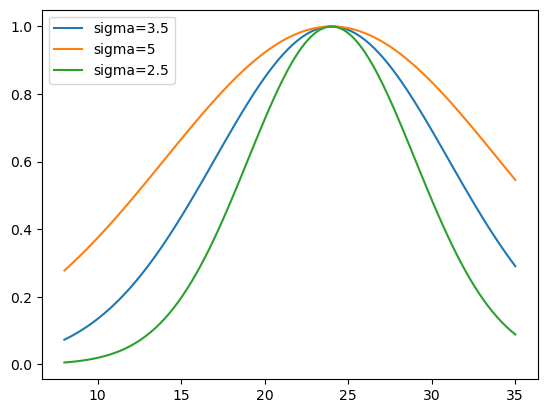

In [6]:
# 测试对于高斯函数而言，不同的theta squared值对于系数的影响
import numpy as np
import matplotlib.pyplot as plt

# 定义高斯函数
def gaussian(x, mu, sigma):
    return np.exp(-np.power(x - 24, 2.) / (8 * np.power(sigma, 2.)))

# 定义x的范围
x = np.linspace(8, 35, 100)

# 定义mu和sigma
mu = 0
sigma_values = [3.5, 5, 2.5]

# 绘制高斯函数
for sigma in sigma_values:
    plt.plot(x, gaussian(x, mu, sigma), label=f'sigma={sigma}')

plt.legend()
plt.show()

In [ ]:
# mu = 20
# sigma = 5

# for temp in range(0, 40, 5):
#     gaussian_result = gaussian(temp, mu, sigma)
#     print(f'gaussian for {temp} is {gaussian_result * 100:.1f}%')


In [ ]:
# index_to_affinity = {0: 0.4, 1: 0.6, 2: 0.8, 3: 0.5, 4: 0.7}

# import numpy as np

# # 假设这是你的索引数组
# index_array = np.array([[0, 1, 2], [3, 4, 0]])

# # 使用 vectorize 将字典应用到数组
# vectorized_map = np.vectorize(index_to_affinity.get)
# affinity_array = vectorized_map(index_array)

# print(affinity_array)


In [ ]:
# import xarray as xr
# import numpy as np

# # 示例 DataArray
# data = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])
# coords = {'x': [0, 1, 2], 'y': [0, 1, 2]}
# dims = ['x', 'y']
# da = xr.DataArray(data, coords=coords, dims=dims)

# # 进行 shift 操作并填充消失的位置为 0
# # lakeRedearProbShifted = lakeRedearProb.shift(x=1)
# da = da.shift(x=1, fill_value=0)

# # 裁剪掉包含 NaN 的部分
# # lakeRedearProbShifted = lakeRedearProbShifted.dropna(dim='x', how='all')

# print(da)

# obsolete-另一种绘图方式

In [ ]:
# # 绘制3D material分布
# fig = plt.figure(figsize=(15, 15))  # 调整图形尺寸
# ax = fig.add_subplot(111, projection='3d')

# # 定义颜色和透明度. water: blue, ground: black, water grass: green, stone: grey; all half-transparent
# colors = {
#     Material.WATER.value: (0, 0, 1, 0.5),  # 半透明蓝色
#     Material.GROUND.value: (0.1, 0.1, 0.1, 1)  # 半透明浅灰色
#     ,Material.WATER_GRASS.value: (0, 1, 0, 0.5)  # 半透明绿色
#     , Material.STONE.value: (0.5, 0.5, 0.5, 0.5)  # 半透明灰色
# }

# # 函数：生成体素的顶点
# def cuboid_data(origin, size=(1, 1, 1)):
#     X = [[0, 0, 1, 1, 0, 0, 1, 1],
#          [0, 1, 1, 0, 0, 1, 1, 0],
#          [0, 0, 0, 0, 1, 1, 1, 1]]
#     X = np.array(X)
#     X = X * np.array(size).reshape(3, 1)
#     X = X + np.array(origin).reshape(3, 1)
#     return X

# # 函数：绘制体素
# def plot_cube(ax, position, color, size=(1, 1, 1)):
#     vertices = cuboid_data(position, size)
#     faces = [[vertices[:, j] for j in [0, 1, 2, 3]],
#              [vertices[:, j] for j in [4, 5, 6, 7]], 
#              [vertices[:, j] for j in [0, 3, 7, 4]], 
#              [vertices[:, j] for j in [1, 2, 6, 5]], 
#              [vertices[:, j] for j in [0, 1, 5, 4]], 
#              [vertices[:, j] for j in [2, 3, 7, 6]]]
#     poly3d = Poly3DCollection(faces, facecolors=color, linewidths=1, edgecolors='k', alpha=color[3])
#     ax.add_collection3d(poly3d)

# # 设置体素的大小
# voxel_size = (1, 1, 1)

# # 遍历每个体素并绘制
# x_start = 50
# x_end = 60
# y_start = 20
# y_end = 30

# for x in range(x_start, x_end):
#     for y in range(y_start, y_end):
#         for z in range(lake_depth):
#             material = lake['material'].isel(x=x, y=y, z=z).item()
#             color = colors[material]
#             plot_cube(ax, (x, y, z), color, size=voxel_size)

# # 设置坐标轴范围
# ax.set_xlim([x_start, x_end])
# ax.set_ylim([y_start, y_end])
# ax.set_zlim([lake_depth,0])

# # 设置坐标轴标签
# ax.set_xlabel('X')
# ax.set_ylabel('Y')
# ax.set_zlabel('Z')

# # 调整视角
# ax.view_init(elev=20, azim=30)

# plt.show()

In [ ]:
sizeTimes = 5

# 做一个huge的lake，长宽高都是原来的sizeTimes倍，相当于把每个格子拆成sizeTimes * sizeTimes * sizeTimes个小格子。这个过程相当于后端把2d编辑器的信息转换成3d编辑器的信息，是提前做的，不需要经常计算。
hugeLake = xr.Dataset({
    'material': (['x', 'y', 'z'], np.random.randint(0, 2, (lake_length*sizeTimes, lake_width*sizeTimes, lake_depth*sizeTimes))),
    'temperature': (['x', 'y', 'z'], np.random.randint(10, 20, (lake_length*sizeTimes, lake_width*sizeTimes, lake_depth*sizeTimes))),
    'fish_weights': (['x', 'y', 'z', 'fish_type'], np.random.rand(lake_length*sizeTimes, lake_width*sizeTimes, lake_depth*sizeTimes, 4))
})

# 把material赋值好，每个格子的material等于原来拆之前的格子的material。相当于原来的一个格子变成了sizeTimes*sizeTimes*sizeTimes个小格子
for x in range(lake_length):
    for y in range(lake_width):
        for z in range(lake_depth):
            hugeLake['material'].loc[{'x': slice(x*sizeTimes, (x+1)*sizeTimes), 'y': slice(y*sizeTimes, (y+1)*sizeTimes), 'z': slice(z*sizeTimes, (z+1)*sizeTimes)}] = lake['material'].isel(x=x, y=y, z=z).item()

In [ ]:
print(hugeLake.temperature)

<xarray.DataArray 'temperature' (x: 795, y: 320, z: 25)>
array([[[25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ],
        [25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ],
        [25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ],
        ...,
        [25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ],
        [25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ],
        [25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ]],

       [[25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ],
        [25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ],
        [25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ],
        ...,
        [25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ],
        [25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ],
        [25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ]],

       [[25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ],
        [25.   , 24.375, 23.75 , ..., 11.25 , 10.625, 10.   ],
        [25.   , 24.375, 23.75 

In [ ]:
# 求z轴的size
sizeOfZ = hugeLake['material'].sizes['z']
print(sizeOfZ)

# 给温度赋值，用等差数列. 从temperatureSurface到temperatureBottom的等差数据列。z=0是surface，z=maxdepth是bottom
huge_lake_temperature = np.linspace(temperatureSurface, temperatureBottom, sizeOfZ)
# 用broadcast_to函数将lake_temperature广播到hugeLake的temperature上
broadcastedTemp = np.broadcast_to(huge_lake_temperature, hugeLake['temperature'].shape)
hugeLake['temperature'] = xr.DataArray(broadcastedTemp, coords=hugeLake['temperature'].coords, dims=hugeLake['temperature'].dims)
# print(hugeLake['temperature'][14,14,5])

25


In [ ]:
redearhugeLakeProb = get_prob_arr_by_fish_type(FishType.REDEAR_SUNFISH, hugeLake)
redearhugeLakeProbAfterBleed, lakeWhenBleeded = bleedStepsFromScratch(redearhugeLakeProb, 0.7, 5, hugeLake)


lake['material'] shape: (795, 320, 25)
Initial fish_prob shape: ()
fish_prob_da shape after broadcasting: (1, 1, 1)
fish_prob_da_manual shape after manual broadcasting: (795, 320, 25)


In [ ]:
plotViridis(redearhugeLakeProbAfterBleed, hugeLake, 400)

In [99]:
import numpy as np
import xarray as xr
import time

# 创建一个大的随机数组
data = np.random.rand(10000, 10000)

# 用 Numpy 创建索引数组
index_array = np.random.randint(0, 10000, size=(10000,))

# 用 xarray 创建 DataArray
data_xr = xr.DataArray(data, dims=["x", "y"])

# 对 Numpy 使用 take_along_axis 测试性能
start_time = time.time()
result_np = np.take_along_axis(data, index_array[:, None], axis=1)
end_time = time.time()
numpy_time = end_time - start_time
print(f"Numpy take_along_axis 时间: {numpy_time:.6f} 秒")

# 对 xarray 使用 isel 测试性能
start_time = time.time()
result_xr = data_xr.isel(y=index_array)
end_time = time.time()
xarray_time = end_time - start_time
print(f"Xarray isel 时间: {xarray_time:.6f} 秒")


Numpy take_along_axis 时间: 0.001000 秒
Xarray isel 时间: 2.253786 秒
